In [1]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [2]:
#install TFOBDA
#1. clone the repo
%cd /content/drive/MyDrive/LivestockDetection2025/CenterNet_Training

/content/drive/MyDrive/LivestockDetection2025/CenterNet_Training


In [3]:
!git clone --recursive https://github.com/tensorflow/models.git

Cloning into 'models'...
remote: Enumerating objects: 102233, done.
remote: Counting objects: 100% (308/308), done.
remote: Compressing objects: 100% (166/166), done.
remote: Total 102233 (delta 208), reused 143 (delta 142), pack-reused 101925 (from 2)
Receiving objects: 100% (102233/102233), 644.65 MiB | 16.55 MiB/s, done.
Resolving deltas: 100% (72854/72854), done.
Updating files: 100% (3928/3928), done.


In [4]:
#install dependencies
!pip install tf_slim
!apt-get update && apt-get install -y -qq protobuf-compiler python-pil python-lxml python-tk
!pip install -q Cython contextlib2 pillow lxml matplotlib
!pip install -q pycocotools

Hit:1 https://cloud.r-project.org/bin/linux/ubuntu jammy-cran40/ InRelease
Hit:2 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu2204/x86_64  InRelease
Hit:3 http://archive.ubuntu.com/ubuntu jammy InRelease
Hit:4 http://security.ubuntu.com/ubuntu jammy-security InRelease
Hit:5 http://archive.ubuntu.com/ubuntu jammy-updates InRelease
Hit:6 http://archive.ubuntu.com/ubuntu jammy-backports InRelease
Hit:7 https://ppa.launchpadcontent.net/deadsnakes/ppa/ubuntu jammy InRelease
Hit:8 https://ppa.launchpadcontent.net/graphics-drivers/ppa/ubuntu jammy InRelease
Hit:9 https://ppa.launchpadcontent.net/ubuntugis/ppa/ubuntu jammy InRelease
Hit:10 https://r2u.stat.illinois.edu/ubuntu jammy InRelease
Reading package lists... Done
W: Skipping acquire of configured file 'main/source/Sources' as repository 'https://r2u.stat.illinois.edu/ubuntu jammy InRelease' does not seem to provide it (sources.list entry misspelt?)
E: Unable to locate package python-pil
E: Unable to locate package pyt

In [3]:
#now install the API
%cd /content/drive/MyDrive/LivestockDetection2025/CenterNet_Training/models/research
!protoc object_detection/protos/*.proto --python_out=.
!cp object_detection/packages/tf2/setup.py .
!python -m pip install .

/content/drive/MyDrive/LivestockDetection2025/CenterNet_Training/models/research
Processing /content/drive/MyDrive/LivestockDetection2025/CenterNet_Training/models/research
  Preparing metadata (setup.py) ... done
  Using cached tensorflow-2.19.0-cp311-cp311-manylinux_2_17_x86_64.manylinux2014_x86_64.whl.metadata (4.1 kB)
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.1/62.1 kB 6.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.0/62.0 kB 6.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.0/62.0 kB 7.1 MB/s eta 0:00:00
  Using cached numpy-1.26.4-cp311-cp311-manylinux_2_17_x86_64.manylinux2014_x86_64.whl.metadata (61 kB)
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 644.9/644.9 MB 1.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.4/1.4 MB 75.8 MB/s eta 0:00:00
Using cached numpy-1.26.4-cp311-cp311-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (18.3 MB)
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 43.9/43.9 kB 4.6 MB/s eta 0:00:00
  

In [5]:
#export paths
!export PYTHONPATH=$PYTHONPATH:/content/drive/MyDrive/LivestockDetection2025/CenterNet_Training/models/research
!export PYTHONPATH=$PYTHONPATH:/content/drive/MyDrive/LivestockDetection2025/CenterNet_Training/models/research/object_detection
!export PYTHONPATH=$PYTHONPATH:/content/drive/MyDrive/LivestockDetection2025/CenterNet_Training/models/research/slim

In [7]:
!pip install protobuf==3.20.3

  Using cached protobuf-3.20.3-py2.py3-none-any.whl.metadata (720 bytes)
Using cached protobuf-3.20.3-py2.py3-none-any.whl (162 kB)
  Attempting uninstall: protobuf
    Found existing installation: protobuf 5.29.5
    Uninstalling protobuf-5.29.5:
      Successfully uninstalled protobuf-5.29.5
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
dopamine-rl 4.1.2 requires jax>=0.1.72, which is not installed.
dopamine-rl 4.1.2 requires jaxlib>=0.1.51, which is not installed.
orbax-checkpoint 0.11.20 requires jax>=0.5.0, which is not installed.
ydf 0.13.0 requires protobuf<7.0.0,>=5.29.1, but you have protobuf 3.20.3 which is incompatible.
tensorflow-metadata 1.17.2 requires protobuf>=4.25.2; python_version >= "3.11", but you have protobuf 3.20.3 which is incompatible.
grpcio-status 1.71.2 requires grpcio>=1.71.2, but you have grpcio 1.65.5 which is incompatible.
grpc

In [8]:
!pip uninstall -y keras
!pip install keras==2.13.1

Found existing installation: keras 3.11.1
Uninstalling keras-3.11.1:
  Successfully uninstalled keras-3.11.1
  Using cached keras-2.13.1-py3-none-any.whl.metadata (2.4 kB)
Using cached keras-2.13.1-py3-none-any.whl (1.7 MB)
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
dopamine-rl 4.1.2 requires jax>=0.1.72, which is not installed.
dopamine-rl 4.1.2 requires jaxlib>=0.1.51, which is not installed.
tensorflow 2.19.0 requires keras>=3.5.0, but you have keras 2.13.1 which is incompatible.
keras-hub 0.21.1 requires keras>=3.5, but you have keras 2.13.1 which is incompatible.


In [2]:
# Step 1: Completely remove existing keras
!pip uninstall -y keras keras-nightly keras-preprocessing keras-vis

# Step 2: Downgrade to a compatible version
!pip install keras==2.13.1

# Step 3: Ensure TensorFlow is also compatible
!pip install tensorflow==2.13.0


Found existing installation: keras 2.13.1
Uninstalling keras-2.13.1:
  Successfully uninstalled keras-2.13.1
  Using cached keras-2.13.1-py3-none-any.whl.metadata (2.4 kB)
Using cached keras-2.13.1-py3-none-any.whl (1.7 MB)
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
dopamine-rl 4.1.2 requires jax>=0.1.72, which is not installed.
dopamine-rl 4.1.2 requires jaxlib>=0.1.51, which is not installed.
tensorflow-decision-forests 1.12.0 requires tensorflow==2.19.0, but you have tensorflow 2.13.0 which is incompatible.
tf-keras 2.19.0 requires tensorflow<2.20,>=2.19, but you have tensorflow 2.13.0 which is incompatible.
keras-hub 0.21.1 requires keras>=3.5, but you have keras 2.13.1 which is incompatible.
tensorflow-text 2.19.0 requires tensorflow<2.20,>=2.19.0, but you have tensorflow 2.13.0 which is incompatible.


In [2]:
!pip uninstall -y jax jaxlib
!pip install numpy==1.23.5

In [4]:
!pip install --upgrade scipy==1.11.4 numpy==1.26.4

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 60.4/60.4 kB 5.9 MB/s eta 0:00:00
  Using cached numpy-1.26.4-cp311-cp311-manylinux_2_17_x86_64.manylinux2014_x86_64.whl.metadata (61 kB)
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 36.4/36.4 MB 71.6 MB/s eta 0:00:00
Using cached numpy-1.26.4-cp311-cp311-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (18.3 MB)
  Attempting uninstall: numpy
    Found existing installation: numpy 1.23.5
    Uninstalling numpy-1.23.5:
      Successfully uninstalled numpy-1.23.5
  Attempting uninstall: scipy
    Found existing installation: scipy 1.16.1
    Uninstalling scipy-1.16.1:
      Successfully uninstalled scipy-1.16.1
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
chex 0.1.90 requires jax>=0.4.27, which is not installed.
chex 0.1.90 requires jaxlib>=0.4.27, which is not installed.
dopamine-rl 4.1.2 requires jax>=0.1.72, which 

In [5]:
#test installation
!python3 /content/drive/MyDrive/LivestockDetection2025/CenterNet_Training/models/research/object_detection/builders/model_builder_tf2_test.py

2025-08-08 22:10:19.711231: I tensorflow/core/util/port.cc:110] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2025-08-08 22:10:19.713754: I tensorflow/tsl/cuda/cudart_stub.cc:28] Could not find cuda drivers on your machine, GPU will not be used.
2025-08-08 22:10:19.762151: I tensorflow/tsl/cuda/cudart_stub.cc:28] Could not find cuda drivers on your machine, GPU will not be used.
2025-08-08 22:10:19.762682: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX512F AVX512_VNNI FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2025-08-08 22:10:21.140460: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Co

In [6]:
import os

images_dir = "/content/drive/MyDrive/LivestockDetection2025/SSD_Training/dataset_tf_2025/JPEGImages"
annotations_dir = "/content/drive/MyDrive/LivestockDetection2025/SSD_Training/dataset_tf_2025/Annotations"
output_txt = "/content/drive/MyDrive/LivestockDetection2025/SSD_Training/dataset_tf_2025/ImageSets/Main/train.txt"

os.makedirs(os.path.dirname(output_txt), exist_ok=True)
valid_filenames = []

for img_file in os.listdir(images_dir):
    if img_file.lower().endswith(".jpg"):
        base = os.path.splitext(img_file)[0]
        xml_file = os.path.join(annotations_dir, base + ".xml")
        if os.path.exists(xml_file):
            valid_filenames.append(base)

# Write clean train.txt
with open(output_txt, "w") as f:
    f.write("\n".join(valid_filenames))

print(f"✅ Done. {len(valid_filenames)} valid image-annotation pairs found.")
print(f"Saved to: {output_txt}")


✅ Done. 259 valid image-annotation pairs found.
Saved to: /content/drive/MyDrive/LivestockDetection2025/SSD_Training/dataset_tf_2025/ImageSets/Main/train.txt


In [7]:
import os
from PIL import Image
folder_name = "/content/drive/MyDrive/LivestockDetection2025/SSD_Training/dataset_tf_2025/JPEGImages"
files = os.listdir(folder_name)
len(files)
for file in files:
    print(file)
    if file.endswith('JPG'):
        fname = os.path.join(folder_name, file)
        image = Image.open(fname)
        if image.format not in ["JPG", "JPEG"]:
            print ('{} not jpg, hence converting '.format(file))
        image.convert('RGB').save(fname, "JPEG")

ImgTest10.jpeg
ImgTest9.jpeg
ImgTest3.jpeg
ImgTest5.jpeg
ImgTest4.jpeg
ImgTest2.jpeg
ImgTest6.jpeg
ImgTest7.jpeg
ImgTest1.jpeg
ImgTest8.jpeg
N21.jpeg
DJI_0016.JPG
DJI_0029.JPG
DJI_0018.JPG
DJI_0044.JPG
DJI_0045.JPG
DJI_0007.JPG
DJI_0040.JPG
DJI_0043.JPG
DJI_0010.JPG
DJI_0011.JPG
DJI_0042.JPG
DJI_0023.JPG
DJI_0014.JPG
DJI_0008.JPG
DJI_0020.JPG
DJI_0012.JPG
DJI_0022.JPG
DJI_0015.JPG
DJI_0017.JPG
DJI_0009.JPG
DJI_0013.JPG
DJI_0019.JPG
DJI_0024.JPG
DJI_0021.JPG
DJI_0026.JPG
DJI_0028.JPG
DJI_0033.JPG
DJI_0031.JPG
DJI_0025.JPG
DJI_0032.JPG
DJI_0027.JPG
DJI_0037.JPG
DJI_0035.JPG
DJI_0030.JPG
DJI_0034.JPG
DJI_0036.JPG
DJI_0038.JPG
DJI_0041.JPG
DJI_0046.JPG
DJI_0039.JPG
DJI_0047.JPG
DJI_0053.JPG
DJI_0051.JPG
DJI_0054.JPG
DJI_0050.JPG
DJI_0055.JPG
DJI_0056.JPG
DJI_0060.JPG
DJI_0058.JPG
DJI_0061.JPG
DJI_0059.JPG
DJI_0063.JPG
DJI_0065.JPG
DJI_0067.JPG
DJI_0066.JPG
DJI_0064.JPG
DJI_0068.JPG
DJI_0105.JPG
DJI_0106.JPG
DJI_0052.JPG
DJI_0108.JPG
DJI_0107.JPG
DJI_0109.JPG
DJI_0062.JPG
DJI_0110.JPG
DJI_0

In [9]:
#next get data
#label the data
#convert to TFRECORD

#train data
!python3 /content/drive/MyDrive/LivestockDetection2025/SSD_Training/dataset_2_tfrecord_5.py \
      --image_dir /content/drive/MyDrive/LivestockDetection2025/SSD_Training/dataset_tf_2025/JPEGImages \
      --annotations_dir /content/drive/MyDrive/LivestockDetection2025/SSD_Training/dataset_tf_2025/Annotations \
      --output_path  /content/drive/MyDrive/LivestockDetection2025/SSD_Training/train.record \
      --label_map_path  /content/drive/MyDrive/LivestockDetection2025/SSD_Training/label_map.pbtxt

2025-08-08 22:23:09.593668: I tensorflow/core/util/port.cc:110] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2025-08-08 22:23:09.596186: I tensorflow/tsl/cuda/cudart_stub.cc:28] Could not find cuda drivers on your machine, GPU will not be used.
2025-08-08 22:23:09.643885: I tensorflow/tsl/cuda/cudart_stub.cc:28] Could not find cuda drivers on your machine, GPU will not be used.
2025-08-08 22:23:09.644387: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX512F AVX512_VNNI FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2025-08-08 22:23:10.925448: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Co

In [27]:
#get a pretrained model form tensorflow object detection api zoo
# https://github.com/tensorflow/models/blob/master/research/object_detection/g3doc/tf2_detection_zoo.md
%cd /content/drive/MyDrive/LivestockDetection2025/CenterNet_Training
!wget http://download.tensorflow.org/models/object_detection/tf2/20200711/centernet_resnet50_v1_fpn_512x512_coco17_tpu-8.tar.gz

/content/drive/MyDrive/LivestockDetection2025/CenterNet_Training
--2025-08-09 00:09:33--  http://download.tensorflow.org/models/object_detection/tf2/20200711/centernet_resnet50_v1_fpn_512x512_coco17_tpu-8.tar.gz
Resolving download.tensorflow.org (download.tensorflow.org)... 64.233.170.207, 74.125.200.207, 74.125.130.207, ...
Connecting to download.tensorflow.org (download.tensorflow.org)|64.233.170.207|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 204067969 (195M) [application/x-tar]
Saving to: ‘centernet_resnet50_v1_fpn_512x512_coco17_tpu-8.tar.gz’

centernet_resnet50_ 100%[===================>] 194.61M  22.8MB/s    in 10s     

2025-08-09 00:09:43 (19.5 MB/s) - ‘centernet_resnet50_v1_fpn_512x512_coco17_tpu-8.tar.gz’ saved [204067969/204067969]



In [28]:
#unzip the pretrained model
!tar xvzf centernet_resnet50_v1_fpn_512x512_coco17_tpu-8.tar.gz

centernet_resnet50_v1_fpn_512x512_coco17_tpu-8/
centernet_resnet50_v1_fpn_512x512_coco17_tpu-8/checkpoint/
centernet_resnet50_v1_fpn_512x512_coco17_tpu-8/checkpoint/ckpt-0.data-00000-of-00001
centernet_resnet50_v1_fpn_512x512_coco17_tpu-8/checkpoint/checkpoint
centernet_resnet50_v1_fpn_512x512_coco17_tpu-8/checkpoint/ckpt-0.index
centernet_resnet50_v1_fpn_512x512_coco17_tpu-8/pipeline.config
centernet_resnet50_v1_fpn_512x512_coco17_tpu-8/saved_model/
centernet_resnet50_v1_fpn_512x512_coco17_tpu-8/saved_model/saved_model.pb
centernet_resnet50_v1_fpn_512x512_coco17_tpu-8/saved_model/variables/
centernet_resnet50_v1_fpn_512x512_coco17_tpu-8/saved_model/variables/variables.data-00000-of-00001
centernet_resnet50_v1_fpn_512x512_coco17_tpu-8/saved_model/variables/variables.index


In [ ]:
#edit pipeline .config
#number of classes
#train_config, batch, learning_rate (steps, lr) or even change to adam optimiser with lr scheduling
#i normally start with lr of 0.001
#fine_tune_checkpoint path
#number of steps
#fine_tune_checkpoint_type: "detection"
#train_input_reader, eval_input_reader

#create your own new checkpoint directory

In [29]:
!pwd

/content/drive/MyDrive/LivestockDetection2025/CenterNet_Training


In [30]:
!mkdir new_checkpoint

In [14]:
!pip uninstall opencv-python-headless==4.5.5.62
!pip install opencv-python-headless==4.1.2.30

Found existing installation: opencv-python-headless 4.11.0.86
Uninstalling opencv-python-headless-4.11.0.86:
  Would remove:
    /usr/local/lib/python3.11/dist-packages/cv2/*
    /usr/local/lib/python3.11/dist-packages/opencv_python_headless-4.11.0.86.dist-info/*
    /usr/local/lib/python3.11/dist-packages/opencv_python_headless.libs/libavcodec-76c43bf0.so.59.37.100
    /usr/local/lib/python3.11/dist-packages/opencv_python_headless.libs/libavformat-d296e685.so.59.27.100
    /usr/local/lib/python3.11/dist-packages/opencv_python_headless.libs/libavutil-734d06dd.so.57.28.100
    /usr/local/lib/python3.11/dist-packages/opencv_python_headless.libs/libcrypto-8c1ab3ad.so.1.1
    /usr/local/lib/python3.11/dist-packages/opencv_python_headless.libs/libgfortran-91cc3cb1.so.3.0.0
    /usr/local/lib/python3.11/dist-packages/opencv_python_headless.libs/libopenblas-r0-f650aae0.3.3.so
    /usr/local/lib/python3.11/dist-packages/opencv_python_headless.libs/libpng16-ef62451c.so.16.44.0
    /usr/local/li

In [15]:
!apt install --allow-change-held-packages libcudnn8=8.1.0.77-1+cuda11.2

Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
Package libcudnn8 is not available, but is referred to by another package.
This may mean that the package is missing, has been obsoleted, or
is only available from another source

E: Version '8.1.0.77-1+cuda11.2' for 'libcudnn8' was not found


In [34]:
%cd /content/drive/MyDrive/LivestockDetection2025/CenterNet_Training/models/research
!python object_detection/model_main_tf2.py \
  --model_dir=/content/drive/MyDrive/LivestockDetection2025/CenterNet_Training/new_checkpoint \
  --pipeline_config_path=//content/drive/MyDrive/LivestockDetection2025/CenterNet_Training/centernet_resnet50_v1_fpn_512x512_coco17_tpu-8/pipeline.config \
  --alsologtostderr

/content/drive/MyDrive/LivestockDetection2025/CenterNet_Training/models/research
2025-08-09 00:31:18.004520: I tensorflow/core/util/port.cc:110] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2025-08-09 00:31:18.007182: I tensorflow/tsl/cuda/cudart_stub.cc:28] Could not find cuda drivers on your machine, GPU will not be used.
2025-08-09 00:31:18.055030: I tensorflow/tsl/cuda/cudart_stub.cc:28] Could not find cuda drivers on your machine, GPU will not be used.
2025-08-09 00:31:18.055546: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX512F AVX512_VNNI FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2025-08-09 00:31:19.3

In [35]:
#when training is done
#create directory my_model
##export
%cd /content/drive/MyDrive/LivestockDetection2025/CenterNet_Training/models/research
!mkdir my_model
%cd /content/drive/MyDrive/LivestockDetection2025/CenterNet_Training/models/research
!python object_detection/exporter_main_v2.py \
    --input_type image_tensor --pipeline_config_path /content/drive/MyDrive/LivestockDetection2025/CenterNet_Training/centernet_resnet50_v1_fpn_512x512_coco17_tpu-8/pipeline.config \
    --trained_checkpoint_dir /content/drive/MyDrive/LivestockDetection2025/CenterNet_Training/new_checkpoint --output_directory /content/drive/MyDrive/LivestockDetection2025/CenterNet_Training/my_model

/content/drive/MyDrive/LivestockDetection2025/CenterNet_Training/models/research
/content/drive/MyDrive/LivestockDetection2025/CenterNet_Training/models/research
2025-08-09 01:33:37.670980: I tensorflow/core/util/port.cc:110] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2025-08-09 01:33:37.673287: I tensorflow/tsl/cuda/cudart_stub.cc:28] Could not find cuda drivers on your machine, GPU will not be used.
2025-08-09 01:33:37.721307: I tensorflow/tsl/cuda/cudart_stub.cc:28] Could not find cuda drivers on your machine, GPU will not be used.
2025-08-09 01:33:37.721834: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX512F AVX512_VNNI FMA, in other operatio

In [36]:
%load_ext tensorboard
%tensorboard --logdir '/content/drive/MyDrive/LivestockDetection2025/CenterNet_Training/new_checkpoint'

<IPython.core.display.Javascript object>

In [37]:
# Run evaluation using the same checkpoint directory
!python object_detection/model_main_tf2.py \
  --model_dir=/content/drive/MyDrive/LivestockDetection2025/CenterNet_Training/new_checkpoint \
  --pipeline_config_path=/content/drive/MyDrive/LivestockDetection2025/CenterNet_Training/centernet_resnet50_v1_fpn_512x512_coco17_tpu-8/pipeline.config \
  --checkpoint_dir=/content/drive/MyDrive/LivestockDetection2025/CenterNet_Training/new_checkpoint \
  --alsologtostderr


2025-08-09 01:37:05.115096: I tensorflow/core/util/port.cc:110] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2025-08-09 01:37:05.117681: I tensorflow/tsl/cuda/cudart_stub.cc:28] Could not find cuda drivers on your machine, GPU will not be used.
2025-08-09 01:37:05.165998: I tensorflow/tsl/cuda/cudart_stub.cc:28] Could not find cuda drivers on your machine, GPU will not be used.
2025-08-09 01:37:05.166506: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX512F AVX512_VNNI FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2025-08-09 01:37:06.409099: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Co

In [38]:
# Run evaluation using the same checkpoint directory
!python object_detection/model_main_tf2.py \
  --model_dir=/content/drive/MyDrive/LivestockDetection2025/CenterNet_Training/new_checkpoint \
  --pipeline_config_path=/content/drive/MyDrive/LivestockDetection2025/CenterNet_Training/centernet_resnet50_v1_fpn_512x512_coco17_tpu-8/pipeline.config \
  --checkpoint_dir=/content/drive/MyDrive/LivestockDetection2025/CenterNet_Training/new_checkpoint \
  --alsologtostderr

2025-08-09 01:40:05.668765: I tensorflow/core/util/port.cc:110] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2025-08-09 01:40:05.671319: I tensorflow/tsl/cuda/cudart_stub.cc:28] Could not find cuda drivers on your machine, GPU will not be used.
2025-08-09 01:40:05.719219: I tensorflow/tsl/cuda/cudart_stub.cc:28] Could not find cuda drivers on your machine, GPU will not be used.
2025-08-09 01:40:05.719767: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX512F AVX512_VNNI FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2025-08-09 01:40:06.973801: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Co

In [ ]:
!python object_detection/exporter_main_v2.py \
  --input_type image_tensor \
  --pipeline_config_path=/content/drive/MyDrive/LivestockDetection2025/SSD_Training/ssd_mobilenet_v2_320x320_coco17_tpu-8/pipeline.config \
  --trained_checkpoint_dir=/content/drive/MyDrive/LivestockDetection2025/SSD_Training/new_checkpoint \
  --output_directory=/content/drive/MyDrive/LivestockDetection2025/SSD_Training/exported_model

2025-05-27 13:39:15.187588: I tensorflow/core/util/port.cc:110] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2025-05-27 13:39:15.189783: I tensorflow/tsl/cuda/cudart_stub.cc:28] Could not find cuda drivers on your machine, GPU will not be used.
2025-05-27 13:39:15.236178: I tensorflow/tsl/cuda/cudart_stub.cc:28] Could not find cuda drivers on your machine, GPU will not be used.
2025-05-27 13:39:15.236684: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX512F AVX512_VNNI FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2025-05-27 13:39:16.538529: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Co

In [47]:
import tensorflow as tf
import numpy as np
from tensorflow.python.profiler import model_analyzer
from tensorflow.python.profiler.option_builder import ProfileOptionBuilder

# Path to your exported SavedModel
PATH_TO_SAVED_MODEL = "/content/drive/MyDrive/LivestockDetection2025/CenterNet_Training/my_model/saved_model"

# Load model
detect_fn = tf.saved_model.load(PATH_TO_SAVED_MODEL)

# Create a concrete function (needed for profiler)
concrete_func = detect_fn.signatures[
    tf.saved_model.DEFAULT_SERVING_SIGNATURE_DEF_KEY
]

# Get parameter count
# Iterate through all variables and sum up the trainable ones
trainable_params = np.sum([np.prod(v.shape) for v in concrete_func.trainable_variables])
print(f"Parameters: {trainable_params / 1e6:.2f} Million")

# Profile FLOPs
# Note: Profiling FLOPs from a loaded SavedModel can be complex
# The following approach might not work directly for all SavedModels
# For accurate FLOPs, consider profiling during training or using specialized tools
try:
    tf.compat.v1.enable_eager_execution()
    # You might need to call the concrete function with dummy input for profiling
    # For example:
    # dummy_input = tf.random.uniform((1, 512, 512, 3)) # Adjust shape based on your model input
    # _ = concrete_func(dummy_input)
    flops = tf.compat.v1.profiler.profile(
        tf.compat.v1.get_default_graph(),
        options=ProfileOptionBuilder.float_operation()
    )

    if flops is not None:
        print(f"FLOPs: {flops.total_float_ops / 1e9:.2f} GFLOPs")
except Exception as e:
    print(f"Could not profile FLOPs: {e}")

Parameters: 25.25 Million
FLOPs: 0.00 GFLOPs


In [39]:
%matplotlib inline
import numpy as np
import os
import tensorflow as tf
from PIL import Image
import matplotlib.pyplot as plt
from object_detection.utils import label_map_util, visualization_utils as viz_utils

# Paths
PATH_TO_SAVED_MODEL = "/content/drive/MyDrive/LivestockDetection2025/CenterNet_Training/my_model/saved_model"
LABEL_MAP_PATH = "/content/drive/MyDrive/LivestockDetection2025/SSD_Training/label_map.pbtxt"
IMAGE_PATH = "/content/drive/MyDrive/LivestockDetection2025/testing_images/test/DJI_0012.JPG"

# Load model
detect_fn = tf.saved_model.load(PATH_TO_SAVED_MODEL)
category_index = label_map_util.create_category_index_from_labelmap(LABEL_MAP_PATH)

# Load and convert image
image = Image.open(IMAGE_PATH).convert("RGB")
image_np = np.array(image)
input_tensor = tf.convert_to_tensor(image_np)[tf.newaxis, ...]

# Run inference
detections = detect_fn(input_tensor)

# Format detections
num_detections = int(detections.pop('num_detections'))
detections = {k: v[0, :num_detections].numpy() for k, v in detections.items()}
detections['num_detections'] = num_detections
detections['detection_classes'] = detections['detection_classes'].astype(np.int32)

# Debug: print scores
print("Detection scores:", detections['detection_scores'][:10])

# Visualization
image_np_with_detections = image_np.copy()
viz_utils.visualize_boxes_and_labels_on_image_array(
    image_np_with_detections,
    detections['detection_boxes'],
    detections['detection_classes'],
    detections['detection_scores'],
    category_index,
    use_normalized_coordinates=True,
    max_boxes_to_draw=20,
    min_score_thresh=0.3,  # Lower threshold if nothing shows
    agnostic_mode=False)

# Show image
plt.figure(figsize=(12, 8))
plt.imshow(image_np_with_detections)
plt.axis("off")
plt.show()


Detection scores: [0.8643135  0.79748213 0.7482318  0.7449025  0.71398956 0.70739025
 0.7016165  0.6945232  0.6731066  0.60823196]


Detection scores: [0.8643135  0.79748213 0.7482318  0.7449025  0.71398956 0.70739025
 0.7016165  0.6945232  0.6731066  0.60823196]


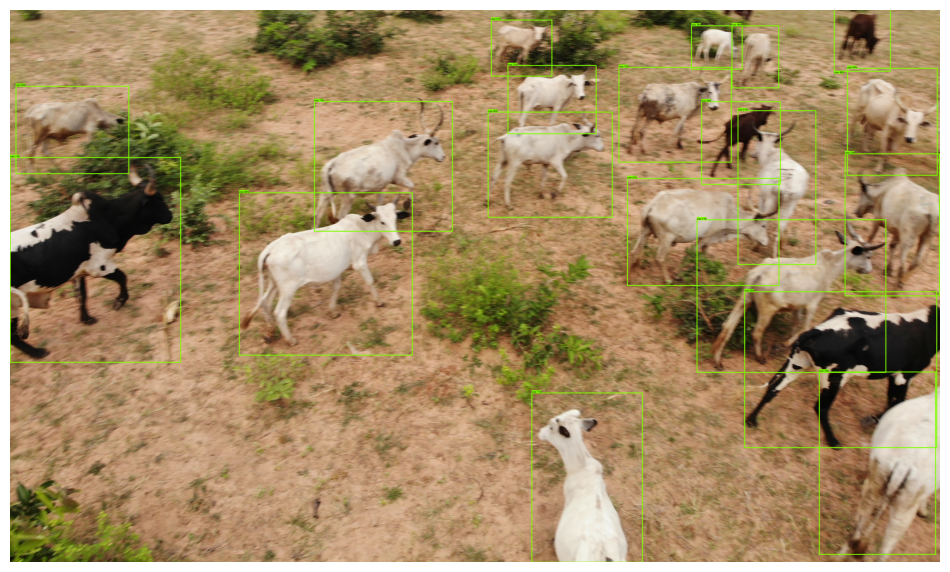

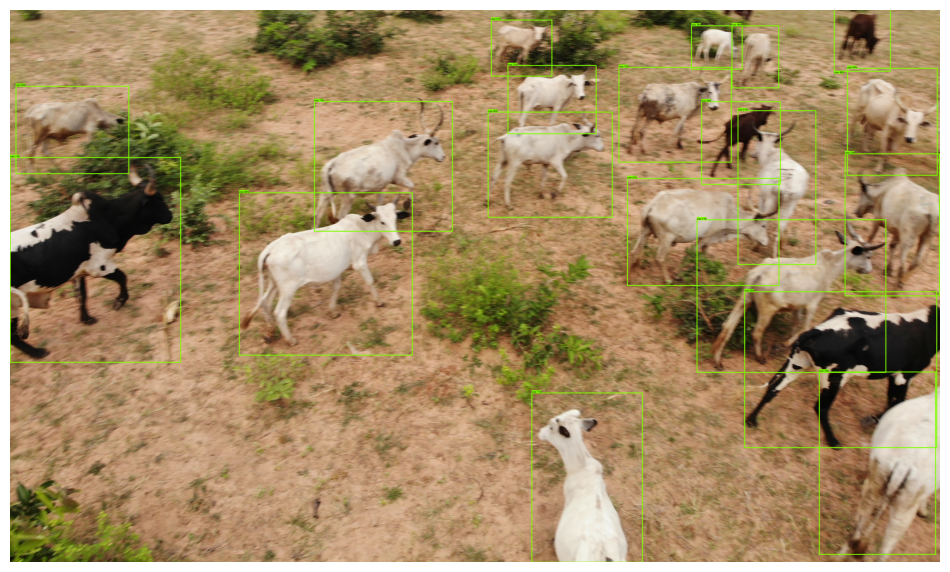

In [40]:
%matplotlib inline
import numpy as np
import os
import tensorflow as tf
from PIL import Image
import matplotlib.pyplot as plt
from object_detection.utils import label_map_util, visualization_utils as viz_utils

# Paths
PATH_TO_SAVED_MODEL = "/content/drive/MyDrive/LivestockDetection2025/CenterNet_Training/my_model/saved_model"
LABEL_MAP_PATH = "/content/drive/MyDrive/LivestockDetection2025/SSD_Training/label_map.pbtxt"
IMAGE_PATH = "/content/drive/MyDrive/LivestockDetection2025/testing_images/test/DJI_0012.JPG"

# Load model
detect_fn = tf.saved_model.load(PATH_TO_SAVED_MODEL)
category_index = label_map_util.create_category_index_from_labelmap(LABEL_MAP_PATH)

# Load and convert image
image = Image.open(IMAGE_PATH).convert("RGB")
image_np = np.array(image)
input_tensor = tf.convert_to_tensor(image_np)[tf.newaxis, ...]

# Run inference
detections = detect_fn(input_tensor)

# Format detections
num_detections = int(detections.pop('num_detections'))
detections = {k: v[0, :num_detections].numpy() for k, v in detections.items()}
detections['num_detections'] = num_detections
detections['detection_classes'] = detections['detection_classes'].astype(np.int32)

# Debug: print scores
print("Detection scores:", detections['detection_scores'][:10])

# Visualization
image_np_with_detections = image_np.copy()
viz_utils.visualize_boxes_and_labels_on_image_array(
    image_np_with_detections,
    detections['detection_boxes'],
    detections['detection_classes'],
    detections['detection_scores'],
    category_index,
    use_normalized_coordinates=True,
    max_boxes_to_draw=20,
    min_score_thresh=0.3,  # Lower threshold if nothing shows
    agnostic_mode=False)

# Show image
plt.figure(figsize=(12, 8))
plt.imshow(image_np_with_detections)
plt.axis("off")
plt.show()


Detection scores: [0.6359333  0.6021237  0.5899785  0.5898537  0.58300954 0.5745531
 0.5733469  0.5657264  0.5467733  0.54543567]


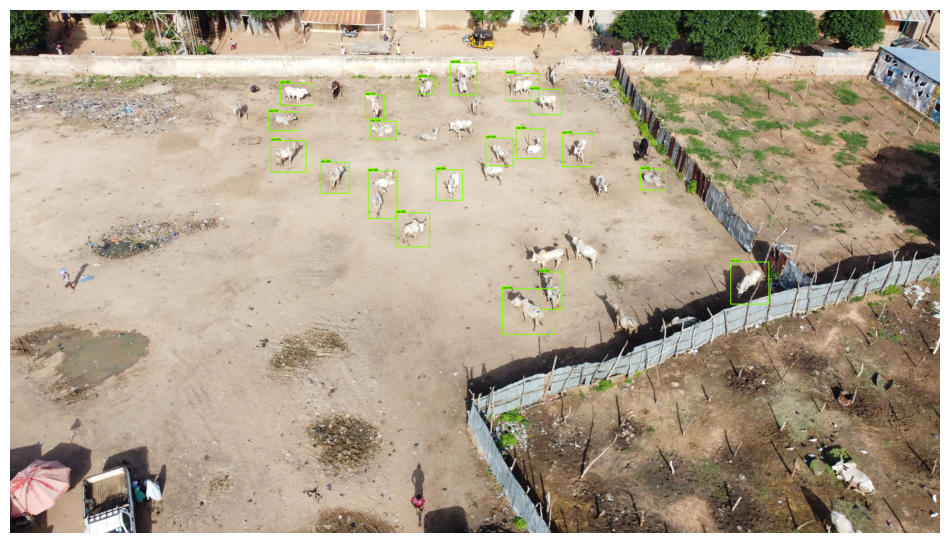

In [41]:
%matplotlib inline
import numpy as np
import os
import tensorflow as tf
from PIL import Image
import matplotlib.pyplot as plt
from object_detection.utils import label_map_util, visualization_utils as viz_utils

# Paths
PATH_TO_SAVED_MODEL = "/content/drive/MyDrive/LivestockDetection2025/CenterNet_Training/my_model/saved_model"
LABEL_MAP_PATH = "/content/drive/MyDrive/LivestockDetection2025/SSD_Training/label_map.pbtxt"
IMAGE_PATH = "/content/drive/MyDrive/LivestockDetection2025/testing_images/test/DJI_0305.JPG"

# Load model
detect_fn = tf.saved_model.load(PATH_TO_SAVED_MODEL)
category_index = label_map_util.create_category_index_from_labelmap(LABEL_MAP_PATH)

# Load and convert image
image = Image.open(IMAGE_PATH).convert("RGB")
image_np = np.array(image)
input_tensor = tf.convert_to_tensor(image_np)[tf.newaxis, ...]

# Run inference
detections = detect_fn(input_tensor)

# Format detections
num_detections = int(detections.pop('num_detections'))
detections = {k: v[0, :num_detections].numpy() for k, v in detections.items()}
detections['num_detections'] = num_detections
detections['detection_classes'] = detections['detection_classes'].astype(np.int32)

# Debug: print scores
print("Detection scores:", detections['detection_scores'][:10])

# Visualization
image_np_with_detections = image_np.copy()
viz_utils.visualize_boxes_and_labels_on_image_array(
    image_np_with_detections,
    detections['detection_boxes'],
    detections['detection_classes'],
    detections['detection_scores'],
    category_index,
    use_normalized_coordinates=True,
    max_boxes_to_draw=20,
    min_score_thresh=0.3,  # Lower threshold if nothing shows
    agnostic_mode=False)

# Show image
plt.figure(figsize=(12, 8))
plt.imshow(image_np_with_detections)
plt.axis("off")
plt.show()


Detection scores: [0.665077  0.6098695 0.6036295 0.602161  0.6019081 0.5969437 0.5921574
 0.5884452 0.5807662 0.578738 ]


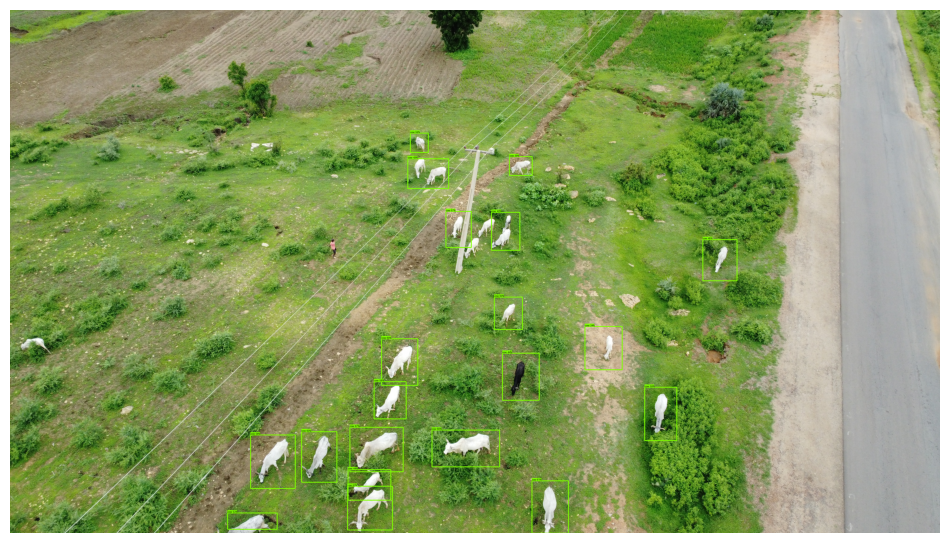

In [42]:
%matplotlib inline
import numpy as np
import os
import tensorflow as tf
from PIL import Image
import matplotlib.pyplot as plt
from object_detection.utils import label_map_util, visualization_utils as viz_utils

# Paths
PATH_TO_SAVED_MODEL = "/content/drive/MyDrive/LivestockDetection2025/CenterNet_Training/my_model/saved_model"
LABEL_MAP_PATH = "/content/drive/MyDrive/LivestockDetection2025/SSD_Training/label_map.pbtxt"
IMAGE_PATH = "/content/drive/MyDrive/LivestockDetection2025/testing_images/test/DJI_0450.JPG"

# Load model
detect_fn = tf.saved_model.load(PATH_TO_SAVED_MODEL)
category_index = label_map_util.create_category_index_from_labelmap(LABEL_MAP_PATH)

# Load and convert image
image = Image.open(IMAGE_PATH).convert("RGB")
image_np = np.array(image)
input_tensor = tf.convert_to_tensor(image_np)[tf.newaxis, ...]

# Run inference
detections = detect_fn(input_tensor)

# Format detections
num_detections = int(detections.pop('num_detections'))
detections = {k: v[0, :num_detections].numpy() for k, v in detections.items()}
detections['num_detections'] = num_detections
detections['detection_classes'] = detections['detection_classes'].astype(np.int32)

# Debug: print scores
print("Detection scores:", detections['detection_scores'][:10])

# Visualization
image_np_with_detections = image_np.copy()
viz_utils.visualize_boxes_and_labels_on_image_array(
    image_np_with_detections,
    detections['detection_boxes'],
    detections['detection_classes'],
    detections['detection_scores'],
    category_index,
    use_normalized_coordinates=True,
    max_boxes_to_draw=20,
    min_score_thresh=0.3,  # Lower threshold if nothing shows
    agnostic_mode=False)

# Show image
plt.figure(figsize=(12, 8))
plt.imshow(image_np_with_detections)
plt.axis("off")
plt.show()


Detection scores: [0.665077  0.6098695 0.6036295 0.602161  0.6019081 0.5969437 0.5921574
 0.5884452 0.5807662 0.578738 ]
Inference time per image: 1051.96 ms (1.0520 seconds)


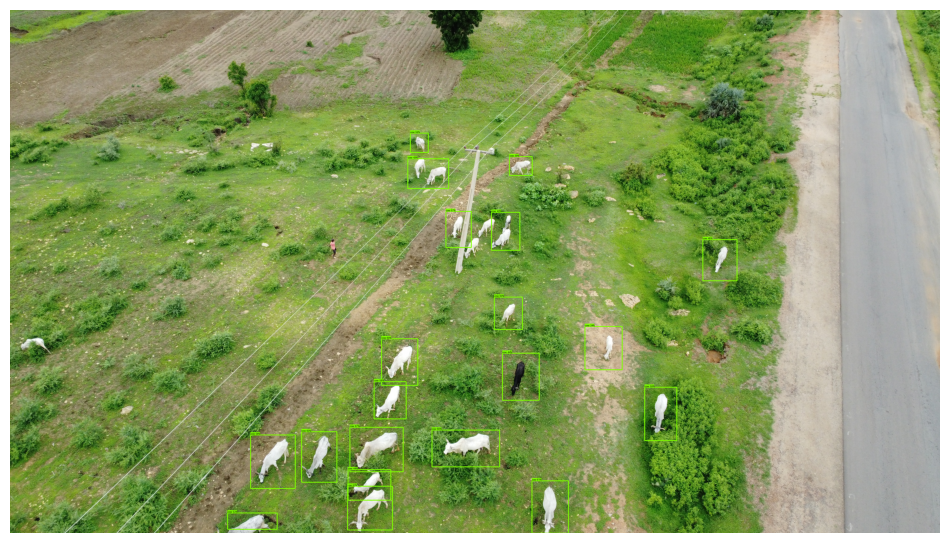

In [43]:
%matplotlib inline
import numpy as np
import os
import tensorflow as tf
import time
from PIL import Image
import matplotlib.pyplot as plt
from object_detection.utils import label_map_util, visualization_utils as viz_utils

# Paths
PATH_TO_SAVED_MODEL = "/content/drive/MyDrive/LivestockDetection2025/CenterNet_Training/my_model/saved_model"
LABEL_MAP_PATH = "/content/drive/MyDrive/LivestockDetection2025/SSD_Training/label_map.pbtxt"
IMAGE_PATH = "/content/drive/MyDrive/LivestockDetection2025/testing_images/test/DJI_0450.JPG"

# Load model
detect_fn = tf.saved_model.load(PATH_TO_SAVED_MODEL)
category_index = label_map_util.create_category_index_from_labelmap(LABEL_MAP_PATH)

# Load and convert image
image = Image.open(IMAGE_PATH).convert("RGB")
image_np = np.array(image)
input_tensor = tf.convert_to_tensor(image_np)[tf.newaxis, ...]

# Run inference with timing
start_time = time.time()
detections = detect_fn(input_tensor)
end_time = time.time()

inference_time = (end_time - start_time) * 1000  # in milliseconds

# Format detections
num_detections = int(detections.pop('num_detections'))
detections = {k: v[0, :num_detections].numpy() for k, v in detections.items()}
detections['num_detections'] = num_detections
detections['detection_classes'] = detections['detection_classes'].astype(np.int32)

# Debug: print scores
print("Detection scores:", detections['detection_scores'][:10])
print(f"Inference time per image: {inference_time:.2f} ms ({inference_time/1000:.4f} seconds)")

# Visualization
image_np_with_detections = image_np.copy()
viz_utils.visualize_boxes_and_labels_on_image_array(
    image_np_with_detections,
    detections['detection_boxes'],
    detections['detection_classes'],
    detections['detection_scores'],
    category_index,
    use_normalized_coordinates=True,
    max_boxes_to_draw=20,
    min_score_thresh=0.3,
    agnostic_mode=False)

# Show image
plt.figure(figsize=(12, 8))
plt.imshow(image_np_with_detections)
plt.axis("off")
plt.show()
